In [7]:
from __future__ import print_function
%matplotlib inline
from pylab import *

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import skimage
from skimage import *
from skimage.color import *
from skimage import io
import numpy as np

import time

In [3]:
def NeNe(img, scaleFac):

    #Rezolucija slike
    imgShape = img.shape
    widht = imgShape[0]
    height = imgShape[1]

    #Rezolucija nove slike
    widhtScaled  = int(widht * scaleFac)
    heightScaled  = int(height * scaleFac)

    #Menjanje faktora uvecavanja zbog boljeg prikaza
    scaleFac = (widhtScaled - 1) / (widht - 1)

    #Nisam nasao bolji nacin da napravim int matricu
    imgNew = np.random.randint( 5, size = (widhtScaled, heightScaled, 3) )

    #Za svaki pixel
    for j in range(0, heightScaled):
        for i in range(0, widhtScaled):

            #Koordinate tacke koja se racuna kada bi bila na originalnoj slici
            x = i/scaleFac
            y = j/scaleFac

            #4 tacke potrebne za izracunavanje
            x1 = int(x)
            x2 = x1 + 1
            y1 = int(y)
            y2 = y1 + 1

            #U slucaju da tacke izlaze iz okvira, sluze za matricu
            x2ind = x2
            y2ind = y2

            #Vracanje tih tacaka na manju vrednost zbog matrice
            if x2 >= widht:
                x2ind = x2-1
            if y2 >= height:
                y2ind = y2-1

            #Glavno izracunavanje 
            if x - x1 < 0.5 :
                if y - y1 < 0.5:
                    newPix = img[x1, y1]
                else:
                    newPix = img[x1, y2ind]
            else:
                if y - y1 < 0.5:
                    newPix = img[x2ind, y1]
                else:
                    newPix = img[x2ind, y2ind]
            
            #Izgleda da je glupo, ali nekad PNG ima 4 stvari umesto 3 (za boje)
            imgNew[i, j, 0] = newPix[0]
            imgNew[i, j, 1] = newPix[1]
            imgNew[i, j, 2] = newPix[2]         

    return imgNew

In [11]:
def BiLin(img, scaleFac):
    
    #Rezolucija slike
    imgShape = img.shape
    widht = imgShape[0]
    height = imgShape[1]

    #Rezolucija nove slike
    widhtScaled  = int(widht * scaleFac)
    heightScaled  = int(height * scaleFac)

    #Menjanje faktora uvecavanja zbog boljeg prikaza
    scaleFac = (widhtScaled - 1) / (widht - 1)

    #Nisam nasao bolji nacin da napravim int matricu
    imgNew = np.random.randint( 5, size = (widhtScaled, heightScaled, 3) )

    #Za svaki pixel
    for j in range(0, heightScaled):
        for i in range(0, widhtScaled):
                
                #Koordinate tacke koja se racuna kada bi bila na originalnoj slici
                x = i/scaleFac
                y = j/scaleFac

                #4 tacke potrebne za izracunavanje
                x1 = int(x)
                x2 = x1 + 1
                y1 = int(y)
                y2 = y1 + 1

                #U slucaju da tacke izlaze iz okvira, sluze za matricu
                x2ind = x2
                y2ind = y2

                #Vracanje tih tacaka na manju vrednost zbog matrice
                if x2 >= widht:
                    x2ind = x2-1
                if y2 >= height:
                    y2ind = y2-1

                #Glavno izracunavanje 
                for k in range(0, 3):
                    fxy1 = (x2 - x) * img[x1, y1, k] + (x - x1) * img[x2ind, y1, k]
                    fxy2 = (x2 - x) * img[x1, y2ind, k] + (x - x1) * img[x2ind, y2ind, k]
                    imgNew[i, j, k] = int((y2 - y) * fxy1 + (y - y1) * fxy2)

    return imgNew

In [12]:
def BiCub(img, scaleFac):
    
    #Rezolucija slike
    imgShape = img.shape
    widht = imgShape[0]
    height = imgShape[1]

    #Rezolucija nove slike
    widhtScaled  = int(widht * scaleFac)
    heightScaled  = int(height * scaleFac)

    #Menjanje faktora uvecavanja zbog boljeg prikaza
    scaleFac = (widhtScaled - 1) / (widht - 1)

    #Nisam nasao bolji nacin da napravim int matricu
    imgNew = np.random.randint( 5, size = (widhtScaled, heightScaled, 3) )

    #Za svaki pixel
    for j in range(0, heightScaled):
        for i in range(0, widhtScaled):
                
                #Koordinate tacke koja se racuna kada bi bila na originalnoj slici
                x = i/scaleFac
                y = j/scaleFac

                #Za lakse racunanje (sluzi za 16 tacaka)
                xn = np.zeros(4)
                yn = np.zeros(4)
                Y = np.zeros(4)
                
                #16 tacaka za izracunavanje
                xn[1] = int(x)
                xn[2] = xn[1] + 1
                xn[3] = xn[1] + 2
                xn[0] = xn[1] - 1

                yn[1] = int(y)
                yn[2] = yn[1] + 1
                yn[3] = yn[1] + 2
                yn[0] = yn[1] - 1

                #Vracanje na manju vrednost ako viri iz okvira slike
                if xn[2] >= widht:
                    xn[2] = xn[2]-1
                if xn[3] >= widht:
                    xn[3] = xn[2]
                if xn[0] < 0:
                    xn[0] = 0
                if yn[2] >= height:
                    yn[2] = yn[2]-1
                if yn[3] >= widht:
                    yn[3] = yn[2]
                if yn[0] < 0:
                    yn[0] = 0

                #Za izracunavanje
                xOff = x - xn[1]
                yOff = y - yn[1]

                #Sluzi za izracunavanje, koeficijenti za Catmull-Rom krive
                Q0x = (-xOff**3 + 2 * xOff**2 - xOff)/2
                Q1x = (3 * xOff**3 - 5 * xOff**2 + 2)/2
                Q2x = (-3 * xOff**3 + 4 * xOff**2 + xOff)/2
                Q3x = (xOff**3 - xOff**2)/2

                Q0y = (-yOff**3 + 2 * yOff**2 - yOff)/2
                Q1y = (3 * yOff**3 - 5 * yOff**2 + 2)/2
                Q2y = (-3 * yOff**3 + 4 * yOff**2 + yOff)/2
                Q3y = (yOff**3 - yOff**2)/2

                #Glavno izracunavanje
                for c in range (3):
                    for k in range (4):
                        Y[k] = img[int(xn[0]), int(yn[k]), c] * Q0x + img[int(xn[1]), int(yn[k]), c] * Q1x + img[int(xn[2]), int(yn[k]), c] * Q2x + img[int(xn[3]), int(yn[k]), c] * Q3x
                    imgNew[i, j, c] = int(Y[0] * Q0y + Y[1] * Q1y + Y[2] * Q2y + Y[3] * Q3y)
                

    return imgNew

In [13]:
imgOrg = io.imread('data/lena.png')
imgDown4 = io.imread('myData/lena4.png')
imgGray = io.imread('myData/grayScale.png')
imgRed = io.imread('myData/redScale.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3.715165853500366 70.58314800262451 113.77878189086914


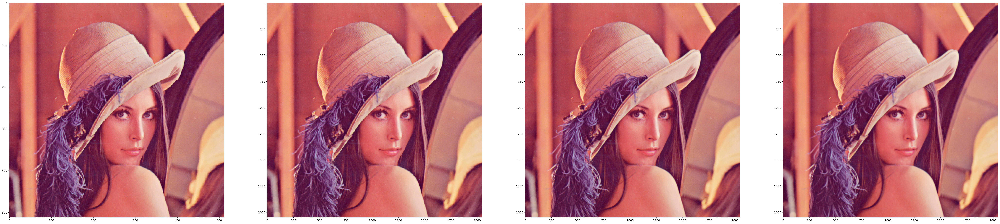

In [21]:
#Povecanje rezolucije originalne slike 4 puta koristeci 3 funkcije i merenje vremena
time1 = time.time()
imgUp4NeNe = NeNe(imgOrg, 4)
time2 = time.time()
imgUp4BiCub = BiLin(imgOrg, 4)
time3 = time.time()
imgUp4BiLin = BiCub(imgOrg, 4)
time4 = time.time()

fig, ax = subplots(1, 4, figsize = (64, 300), dpi = 200)

ax[0].imshow(imgOrg)
ax[1].imshow(imgUp4NeNe)
ax[2].imshow(imgUp4BiLin)
ax[3].imshow(imgUp4BiCub)

timeNeNe = time2 - time1
timeBiLin = time3 - time2
timeBiCUb = time4 - time3

print(timeNeNe, timeBiLin, timeBiCUb)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


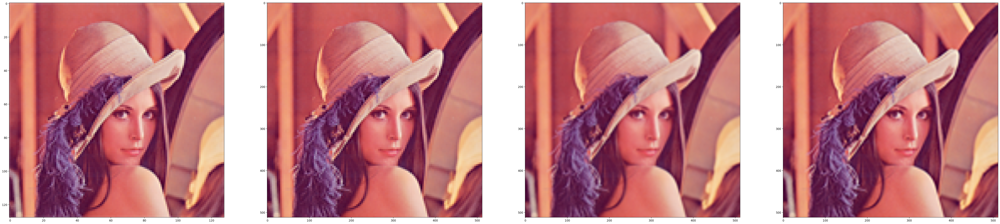

In [20]:
#Povecanje rezolucije slike losijeg kvaliteta nazad na originalnu rezoluciju
imgDown4NeNe = NeNe(imgDown4, 4)
imgDown4BiLin = BiLin(imgDown4, 4)
imgDown4BiCub = BiCub(imgDown4, 4)

fig, ax = subplots(1, 4, figsize = (64, 300), dpi = 200)

ax[0].imshow(imgDown4)
ax[1].imshow(imgDown4NeNe)
ax[2].imshow(imgDown4BiLin)
ax[3].imshow(imgDown4BiCub)

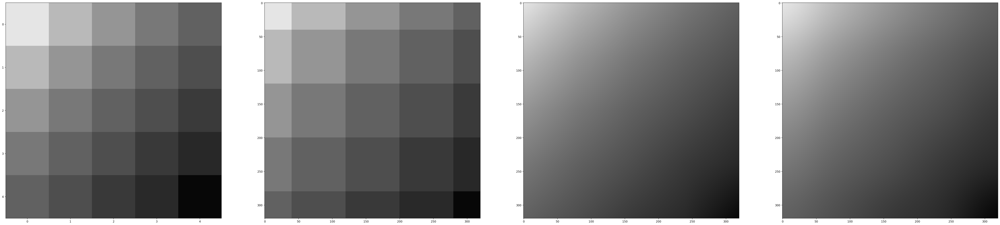

In [17]:
#Povecanje sivog gradijenta
imgGray64NeNe = NeNe(imgGray, 64)
imgGray64BiLin = BiLin(imgGray, 64)
imgGray64BiCub = BiCub(imgGray, 64)

fig, ax = subplots(1, 4, figsize = (64, 300), dpi = 200)

ax[0].imshow(imgGray)
ax[1].imshow(imgGray64NeNe)
ax[2].imshow(imgGray64BiLin)
ax[3].imshow(imgGray64BiCub)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


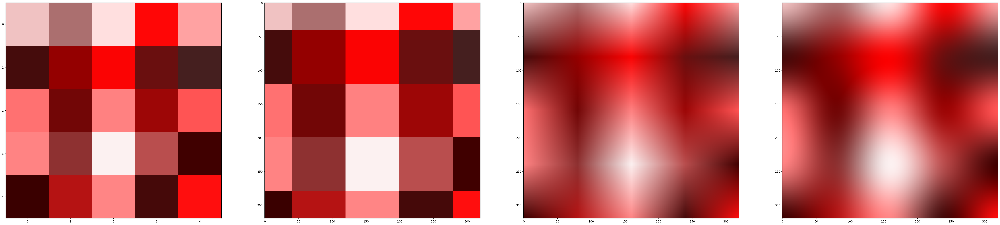

In [18]:
#Povecanje crvenog gradijenta
imgRed64NeNe = NeNe(imgRed, 64)
imgRed64BiLin = BiLin(imgRed, 64)
imgRed64BiCub = BiCub(imgRed, 64)

fig, ax = subplots(1, 4, figsize = (64, 300), dpi = 200)

ax[0].imshow(imgRed)
ax[1].imshow(imgRed64NeNe)
ax[2].imshow(imgRed64BiLin)
ax[3].imshow(imgRed64BiCub)